## <div style="text-align:center; border-radius:15px 50px; padding:10px; color:Black; margin:0; font-size:150%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"> Buenos Aires Tree Census </mark></strong></b>

<center>
<img src="https://argentear.com/wp-content/uploads/2018/11/Jacaranda.jpg" width=1200>
</center>

Hello there! I hope this notebook brings value to your data journey. 

If you have any questions or feedback, feel free to contact me!

[Kaggle](https://www.kaggle.com/martindambrosio) **|** [LinkedIn](https://www.linkedin.com/in/martin-german-dambrosio/)

- Data Source: Gobierno de Buenos Aires, 2017-2018. [link](https://data.buenosaires.gob.ar/dataset/arbolado-publico-lineal/resource/ecf38a47-563f-42c1-9bd4-7cedf35d536b)

- The trees present in the dataset are exclusively those found on public sidewalks. Trees in plazas and parks are not included as they are collected separately.

- The city of Buenos Aires is divided into **Comunas**. To enable comparative analysis of each Comuna, I will also load a shapefile of this political division.

- I will use Python to create maps showing: the total number of trees in a given commune, a map indicating the locations of all **Jacaranda** trees in the city, and a tree **density map** by Comuna.

- Lastly, you will find a **Tableau** dashboard that provides a detailed view of each Comuna and allows comparison of total numbers across various categories.

## <div style="text-align:center; border-radius:15px 50px; padding:10px; color:Black; margin:0; font-size:110%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"> Index </mark></strong></b>

1. [Load and Prepare Data](#1)

2. [Comuna Division Map](#2)

3. [Tree Density Map](#3)

4. [Top Trees by Comuna](#4)

5. [Jacaranda Trees Map](#5)

6. [Detailed Tree Map (Comuna 11)](#6)

7. [Number of Trees by Comuna](#7)

8. [Tree Heights by Comuna](#8)

9. [Av. Analysis](#9)

10. [Streets Analysis](#10)

11. [Height and Diameter Details](#11)

12. [Tableau Dashboard](#12)

<div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 1. **Load and Prepare Data**
<a id="1"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
import plotly.express as px
import folium
from folium.plugins import HeatMap
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('/kaggle/input/buenos-aires-tree-census-dataset/Buenos_Aires_street_tree_census_data.csv')

In [3]:
df.head()

,long,lat,nro_registro,tipo_activ,comuna,manzana,calle_nombre,calle_altura,calle_chapa,direccion_normalizada,ubicacion,nombre_cientifico,ancho_acera,estado_plantera,ubicacion_plantera,nivel_plantera,diametro_altura_pecho,altura_arbol
0,-58.378563,-34.594902,26779,Lineal,1,NaN,Esmeralda,1000.0,1120.0,ESMERALDA 1120,NaN,Tipuana tipu,5.5,Ocupada,Regular,A nivel,88.0,34.0
1,-58.381532,-34.592319,30887,Lineal,1,NaN,Pellegrini Carlos,1300.0,1345.0,"PELLEGRINI, CARLOS 1345",Exacta,Peltophorum dubium,4.5,Ocupada,Regular,Elevada,6.0,5.0
2,-58.379103,-34.591939,30904,Lineal,1,NaN,Arroyo,800.0,848.0,ARROYO 848,Exacta,Fraxinus pennsylvanica,4,Ocupada,Regular,A nivel,7.0,6.0
3,-58.380710,-34.591548,31336,Lineal,1,NaN,Arroyo,900.0,932.0,ARROYO 932,LD,Fraxinus pennsylvanica,NaN,Ocupada,Regular,A nivel,9.0,29.0
4,-58.380710,-34.591548,31337,Lineal,1,NaN,Arroyo,900.0,932.0,ARROYO 932,LA,Jacaranda mimosifolia,NaN,Ocupada,Regular,A nivel,13.0,8.0


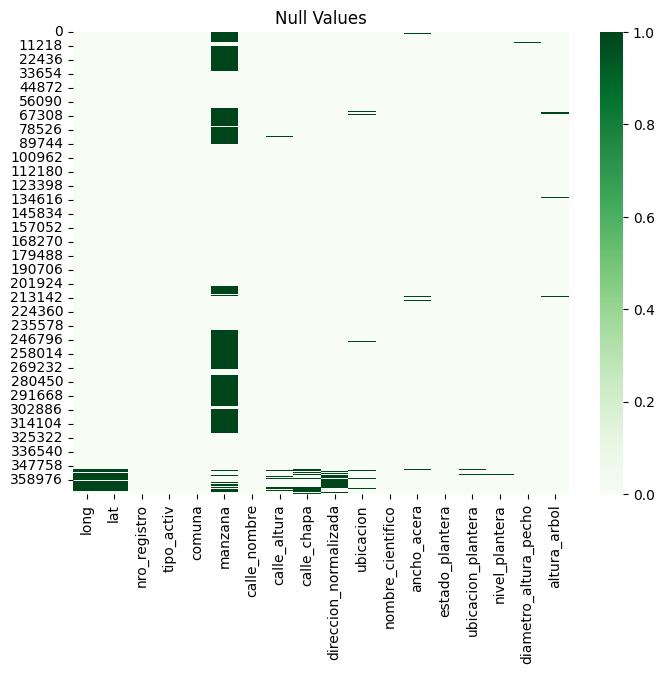

In [4]:
# Visualize Null values
plt.figure(figsize=(8, 6))
sns.heatmap(df.isnull(), cmap='Greens')
plt.title('Null Values')
plt.show()

In [5]:
# Check for duplicates
df['nro_registro'].duplicated().sum()

0

In [6]:
columns_to_check = [
    'tipo_activ', 'comuna', 'manzana', 
    'estado_plantera', 'ubicacion_plantera', 'nivel_plantera'
]

for col in columns_to_check:
    print(f"\n Unique values '{col}':")
    print(df[col].unique())


 Unique values 'tipo_activ':
['Lineal' 'Lineal ' 'LINEAL' 'Lineal  ' 'lineal' 'calle']

 Unique values 'comuna':
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]

 Unique values 'manzana':
[nan '13' '591' ... '23y' '488 bis' '126 b']

 Unique values 'estado_plantera':
['Ocupada' 'Sobreocupada' 'Subocupada' 'Vacía' 'Ocupada ' 'Cerrada'
 'Parcialmente cerrada' 'SobreOcupada' 'ocupada' 'sobreocupada'
 'Sobreocupada parc. cerrada' 'Cantero ocupado']

 Unique values 'ubicacion_plantera':
['Regular' nan 'Fuera de línea' 'Ochava' 'Regular ' 'regular'
 'Fuera Línea,Ochava' 'Cantero Grande' 'Ocupada' 'o' 'Elevada' 'O' 'Och'
 'Ochva' 'Ochava/Fuera Línea' 'Subocupada' 'ochava' 'Fuera Nivel'
 'Sobreocupada' 'Fuera de Línea, Ochava' 'Fuera Línea/Ochava']

 Unique values 'nivel_plantera':
['A nivel' 'Elevada' 'Bajo nivel' nan 'A Nivel' 'Bajo Nivel' 'AN' 'EL'
 'Elevado' 'a Nivel' 'elevada' 'el' 'A nivel ' 'Reducida' 'Bajo Bivel'
 'Eleveda' 'obs: no tiene plantera definida' 'BN' 'Regular' 'bajo nivel'


In [7]:
columns_to_drop = [
    'nivel_plantera', 'ubicacion_plantera', 'estado_plantera', 
    'ancho_acera', 'ubicacion', 'tipo_activ', 'manzana', 'calle_altura', 'calle_chapa'
]

df = df.drop(columns=columns_to_drop)

In [8]:
df.head()

,long,lat,nro_registro,comuna,calle_nombre,direccion_normalizada,nombre_cientifico,diametro_altura_pecho,altura_arbol
0,-58.378563,-34.594902,26779,1,Esmeralda,ESMERALDA 1120,Tipuana tipu,88.0,34.0
1,-58.381532,-34.592319,30887,1,Pellegrini Carlos,"PELLEGRINI, CARLOS 1345",Peltophorum dubium,6.0,5.0
2,-58.379103,-34.591939,30904,1,Arroyo,ARROYO 848,Fraxinus pennsylvanica,7.0,6.0
3,-58.380710,-34.591548,31336,1,Arroyo,ARROYO 932,Fraxinus pennsylvanica,9.0,29.0
4,-58.380710,-34.591548,31337,1,Arroyo,ARROYO 932,Jacaranda mimosifolia,13.0,8.0


In [9]:
df["nombre_cientifico"].value_counts()

nombre_cientifico
Fraxinus pennsylvanica    133609
Platanus x acerifolia      32319
Ficus benjamina            22508
Tilia x moltkei            15605
Melia azedarach            14901
                           ...  
Juglans mandshurica            1
Osmanthus fragrans             1
Sterculia monosperma           1
Ficus microcarpa               1
Pyracantha coccinea            1
Name: count, Length: 431, dtype: int64

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 2. **Comuna Division Map**
<a id="2"></a>

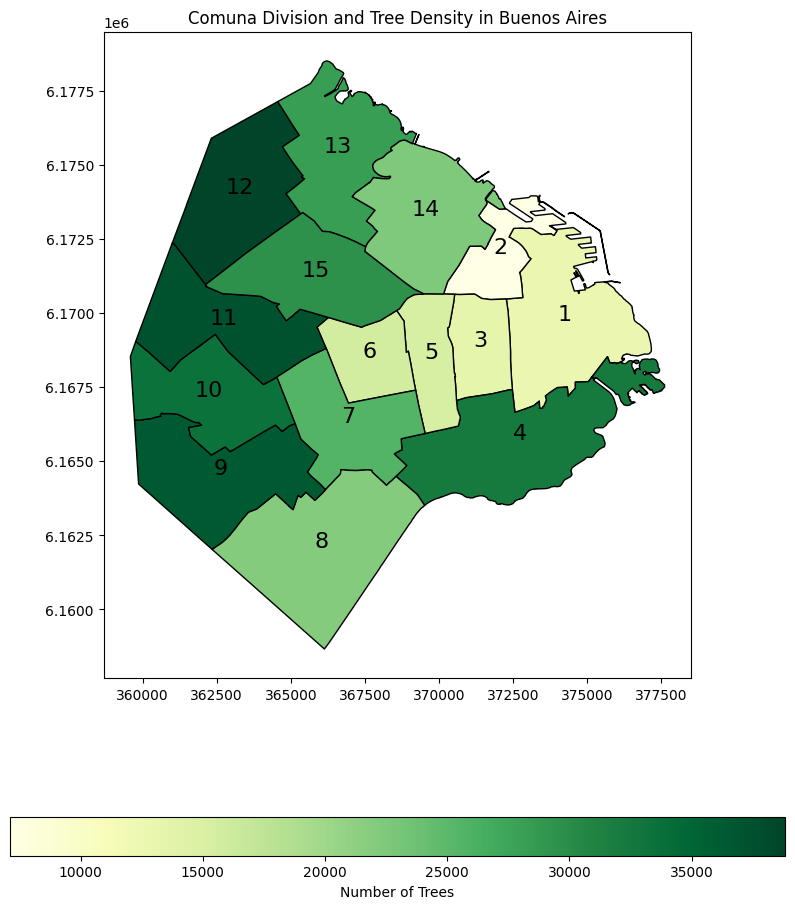

In [10]:
shapefile_path = "/kaggle/input/shapefile-comunas-buenos-aires-argentina/comunas.shp"

# load the shapefile using the path to the .shp
comunas_gdf = gpd.read_file(shapefile_path)

# reproject to a projected CRS
comunas_gdf = comunas_gdf.to_crs(epsg=32721)  # EPSG:32721 is UTM zone 21S, common for Argentina

# centroid of each district
comunas_gdf['centroid'] = comunas_gdf.geometry.centroid

# GeoDataFrame from coordinates (longitude, latitude)
geometry = [Point(xy) for xy in zip(df['long'], df['lat'])]
gdf_trees = gpd.GeoDataFrame(df, geometry=geometry)

# ensure the trees GeoDataFrame is in the same CRS as the districts
gdf_trees.crs = comunas_gdf.crs

# group trees by district and species, and count them
trees_per_comuna = gdf_trees.groupby(["comuna", "nombre_cientifico"]).size().reset_index(name="count")

# join tree count info to the districts GeoDataFrame
comunas_gdf = comunas_gdf.merge(trees_per_comuna.groupby('comuna')['count'].sum().reset_index(), 
                                 on="comuna", how="left")

# visualize the districts map with color intensity based on tree count
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

comunas_gdf.plot(ax=ax, column='count', cmap='YlGn', legend=True,
                 legend_kwds={'label': "Number of Trees",
                              'orientation': "horizontal"},
                 edgecolor="black")

# print the district number at its centroid
for idx, row in comunas_gdf.iterrows():
    centroid = row['centroid']
    ax.text(centroid.x, centroid.y, str(row['comuna']), fontsize=16, ha='center', color='black')


plt.title("Comuna Division and Tree Density in Buenos Aires")
plt.show()


## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 3. **Tree Density Map**
<a id="3"></a>

In [11]:
df_grouped = df.groupby(['lat', 'long']).size().reset_index(name='cantidad_arboles')

mp = folium.Map(location=[-34.61, -58.43], zoom_start=12, control_scale=True)

heat_data = [[row['lat'], row['long'], row['cantidad_arboles']] for index, row in df_grouped.iterrows()]

HeatMap(heat_data, radius=15, blur=25, max_zoom=12).add_to(mp)

mp

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 4. **Top Trees by Comuna**
<a id="4"></a>

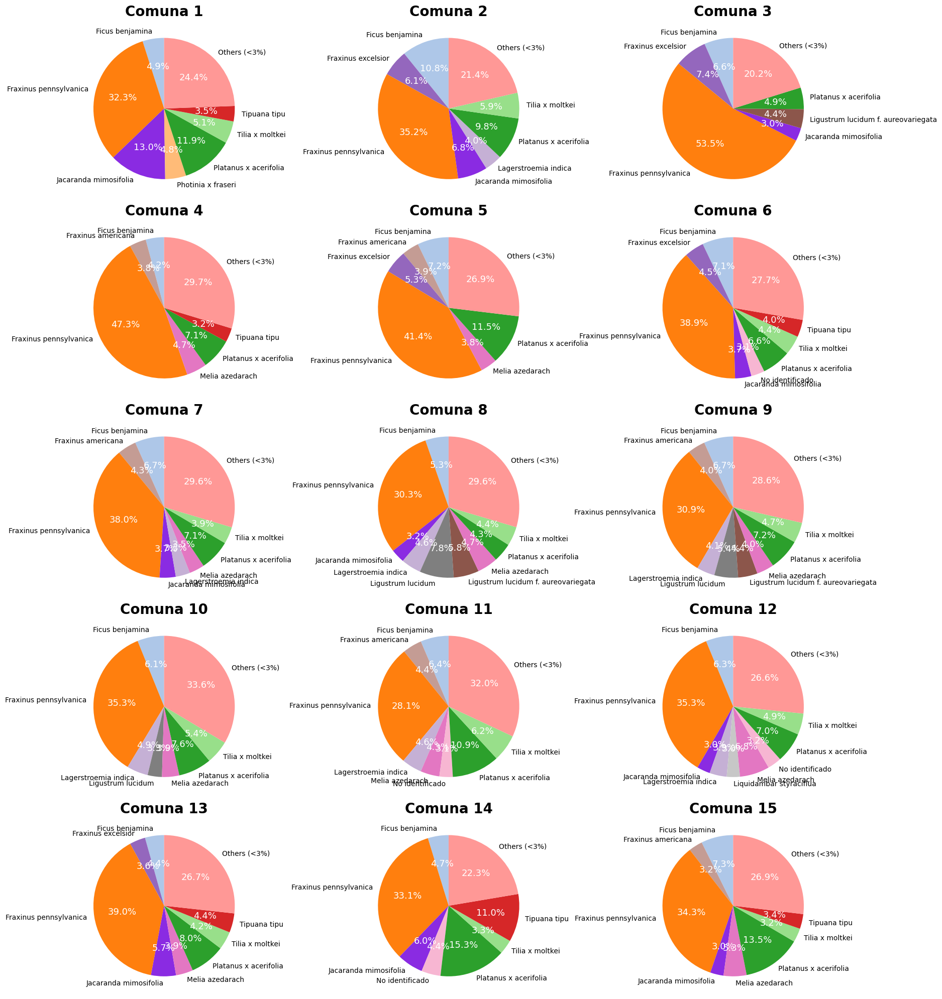

In [12]:
# grouping by comunas and species
trees_per_comuna = df.groupby(['comuna', 'nombre_cientifico']).size().reset_index(name='count')

comunas = trees_per_comuna['comuna'].unique()

# dictionary to store colors assigned to each species
species_colors = {'Jacaranda mimosifolia': '#8A2BE2'}  # Bright violet similar to Jacaranda

# subplots for the charts
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(18, 20))
axes = axes.flatten()

# charts by district
for i, comuna in enumerate(comunas):
    ax = axes[i]
    # filter data for the current district
    comuna_data = trees_per_comuna.loc[trees_per_comuna['comuna'] == comuna]
    
    # calculate proportion and group as "Others (<3%)" if less than 3%
    total_count = comuna_data['count'].sum()
    comuna_data.loc[:, 'proportion'] = comuna_data['count'] / total_count
    others = comuna_data.loc[comuna_data['proportion'] < 0.03, 'count'].sum()
    main_data = comuna_data.loc[comuna_data['proportion'] >= 0.03]
    
    # add "Others (<3%)" if applicable
    if others > 0:
        main_data = pd.concat([main_data, pd.DataFrame({'comuna': [comuna], 'nombre_cientifico': ['Others (<3%)'], 'count': [others], 'proportion': [others / total_count]})])
    
    # create a list of species in the current chart
    species_in_chart = main_data['nombre_cientifico'].unique()
    for specie in species_in_chart:
        if specie not in species_colors:
            # Assign a unique color to each species
            species_colors[specie] = plt.cm.tab20(len(species_colors) % 20 / 20)

    # data for the chart
    sizes = main_data['count']
    labels = main_data['nombre_cientifico']
    colors = [species_colors[specie] for specie in labels]
    
    # pie chart
    wedges, texts, autotexts = ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
    
    for text in autotexts:
        text.set_color('white')
        text.set_fontsize(13)
    
    ax.set_title(f'Comuna {comuna}', fontsize=20, fontweight='bold')
    
# remove empty subplots if there are fewer than 15 districts
for j in range(len(comunas), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


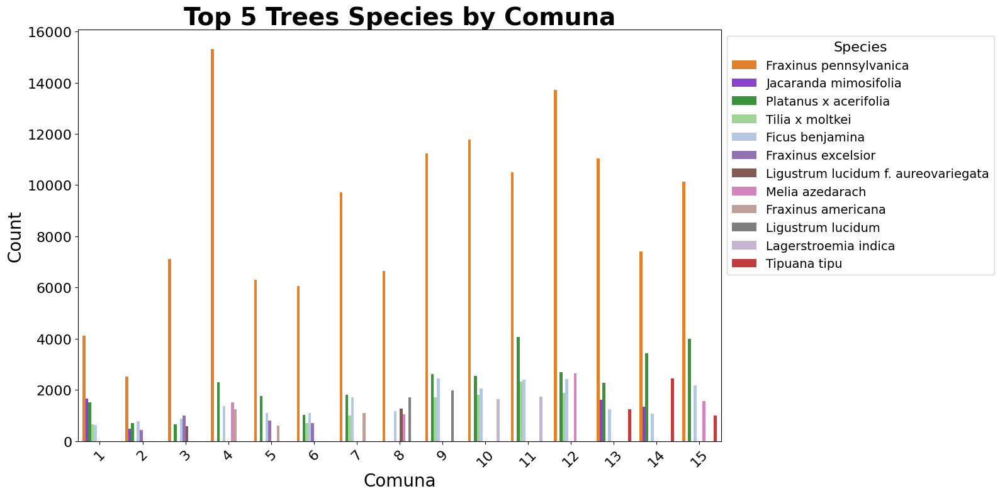

In [13]:
# grouping and sorting data
top_trees_per_comuna = df.groupby(['comuna', 'nombre_cientifico']).size().reset_index(name='count')
top_trees_per_comuna = top_trees_per_comuna.sort_values(['comuna', 'count'], ascending=[True, False])
top_5_trees = top_trees_per_comuna.groupby('comuna').head(5)

# colors list
color_order = [species_colors[species] for species in top_5_trees['nombre_cientifico'].unique()]

plt.figure(figsize=(16, 8))
sns.barplot(data=top_5_trees, x='comuna', y='count', hue='nombre_cientifico', palette=color_order, dodge=True, linewidth=3)
plt.title('Top 5 Trees Species by Comuna', fontsize=28, fontweight='bold')
plt.xlabel('Comuna', fontsize=20)
plt.ylabel('Count', fontsize=20)

plt.legend(title='Species',title_fontsize=16, fontsize=14, bbox_to_anchor=(1.00, 1), loc='upper left')

plt.xticks(rotation=45, fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()


## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 5. **Jacaranda Trees Map**
<a id="5"></a>

In [14]:
df_jacaranda = df[df['nombre_cientifico'] == 'Jacaranda mimosifolia']

fig = px.scatter_mapbox(df_jacaranda, lat="lat", lon="long", color_discrete_sequence=["#8A2BE2"], 
                        mapbox_style="carto-positron", 
                        title="Jacaranda Location")

fig.update_layout(mapbox=dict(center=dict(lat=-34.61, lon=-58.43), zoom=13))
fig.show()

<center> <img src="https://bahiacesar.com/wp-content/uploads/2021/11/Jacaranda-1.jpg" width="1200" style="height:500px; object-fit:cover; object-position:top;"> 

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#A079BF; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 6. **Detailed Tree Map (Comuna 11)**
<a id="6"></a>

In [15]:
df_comuna_11 = df[df['comuna'] == 11]

fig = px.scatter_mapbox(df_comuna_11, lat="lat", lon="long", color="nombre_cientifico", 
                        color_discrete_sequence=px.colors.qualitative.Set1,
                        mapbox_style="carto-positron", 
                        title="Comuna 11")

fig.update_layout(mapbox=dict(center=dict(lat=-34.60, lon=-58.50), zoom=13))
fig.show()

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 7. **Number of Trees by Comuna**
<a id="7"></a>

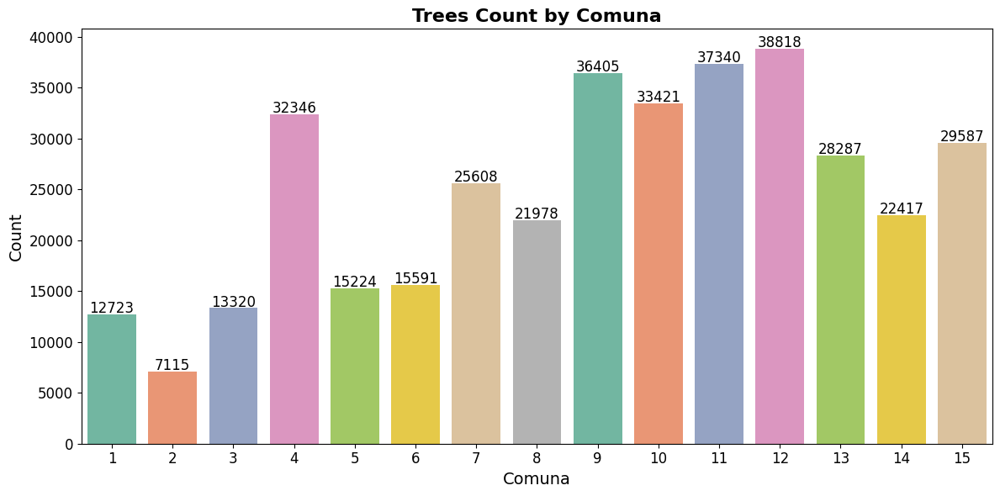

In [16]:
comuna_trees = df.groupby('comuna')['nombre_cientifico'].count().reset_index()

plt.figure(figsize=(12, 6))
ax = sns.barplot(x='comuna', y='nombre_cientifico', data=comuna_trees, palette="Set2")

for i, p in enumerate(ax.patches):
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

plt.title('Trees Count by Comuna', fontsize=16, fontweight='bold')
plt.xlabel('Comuna', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 8. **Tree Heights by Comuna**
<a id="8"></a>

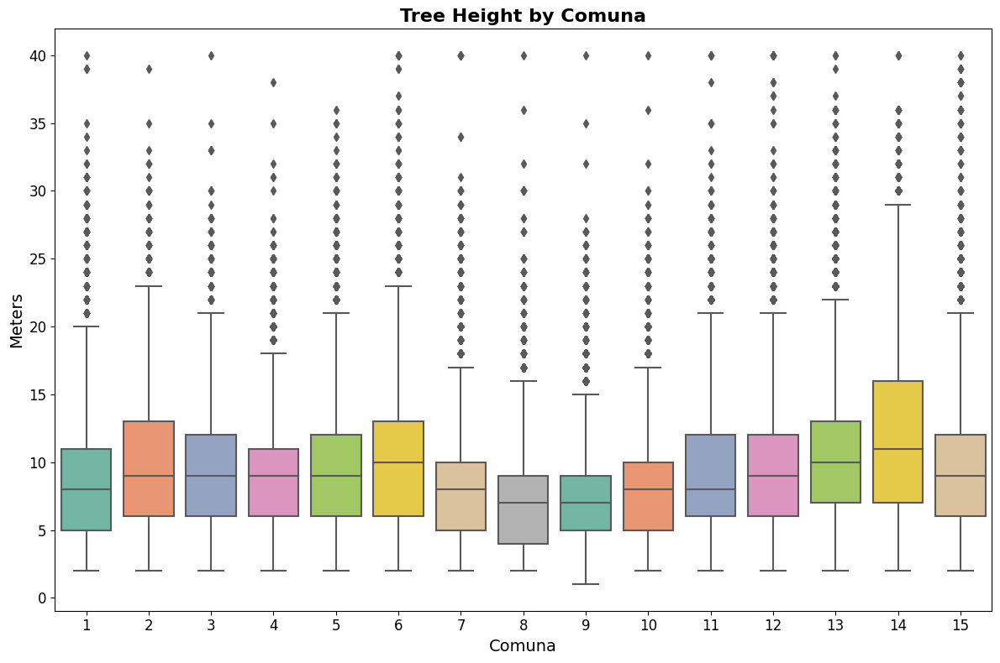

In [17]:
plt.figure(figsize=(12, 8))
ax = sns.boxplot(x='comuna', y='altura_arbol', data=df, palette="Set2")

plt.title('Tree Height by Comuna', fontsize=16, fontweight='bold') 
plt.xlabel('Comuna', fontsize=14) 
plt.ylabel('Meters', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 9. **Av. Analysis**
<a id="9"></a>

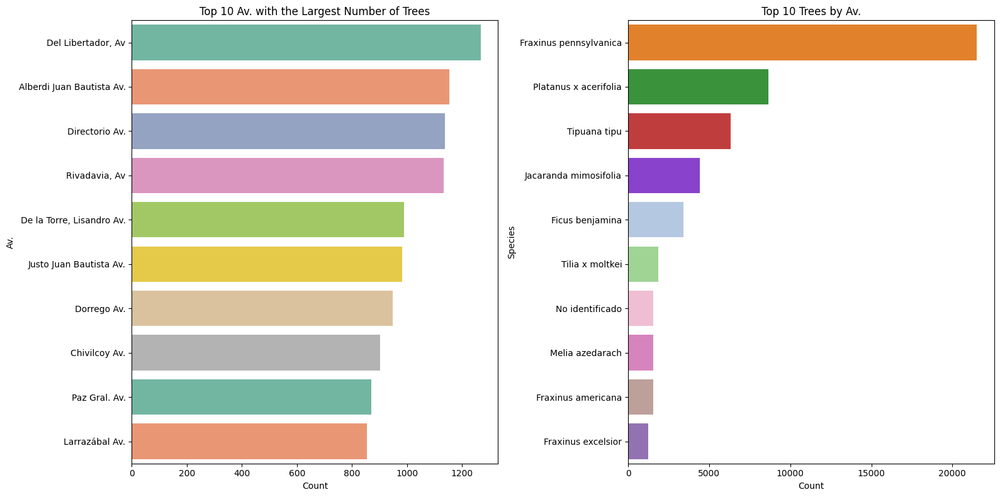

In [18]:
df_av = df[df['calle_nombre'].notna() & df['calle_nombre'].str.contains(' Av', na=False)]
top_10_tree_av = df_av['nombre_cientifico'].value_counts().head(10)
top_10_av = df_av['calle_nombre'].value_counts().head(10)
color_order_av = [species_colors.get(species, 'lightgray') for species in top_10_tree_av.index]

plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
sns.barplot(x=top_10_av.values, y=top_10_av.index, palette="Set2")
plt.title('Top 10 Av. with the Largest Number of Trees')
plt.xlabel('Count')
plt.ylabel('Av.')

plt.subplot(1, 2, 2)
sns.barplot(x=top_10_tree_av.values, y=top_10_tree_av.index, palette=color_order_av)
plt.title('Top 10 Trees by Av.')
plt.xlabel('Count')
plt.ylabel('Species')

plt.tight_layout()
plt.show()

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 10. **Streets Analysis**
<a id="10"></a>

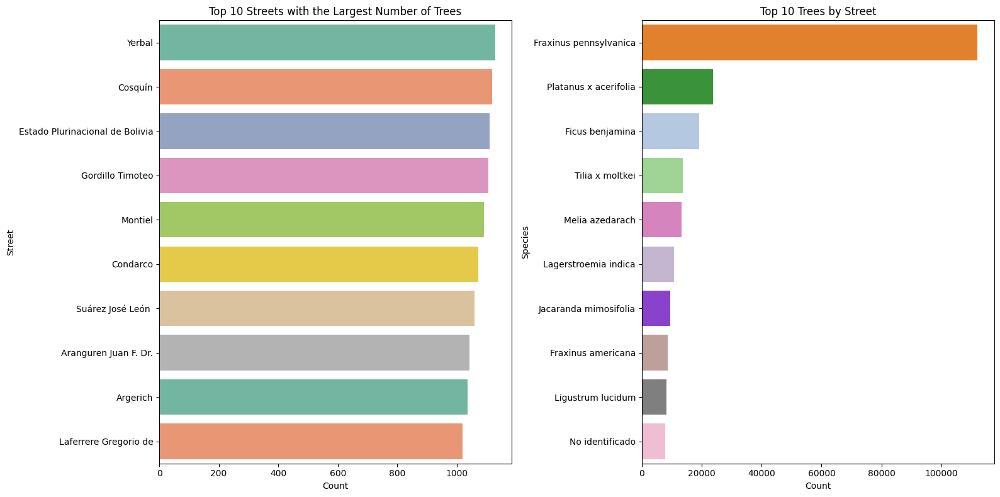

In [19]:
df_streets = df[df['calle_nombre'].notna() & (~df['calle_nombre'].str.contains(' Av', na=False))]
top_10_tree_streets = df_streets['nombre_cientifico'].value_counts().head(10)
top_10_streets = df_streets['calle_nombre'].value_counts().head(10)
color_order_streets = [species_colors.get(species, 'lightgray') for species in top_10_tree_streets.index]

plt.figure(figsize=(16, 8))

plt.subplot(1, 2, 1)
sns.barplot(x=top_10_streets.values, y=top_10_streets.index, palette="Set2")
plt.title('Top 10 Streets with the Largest Number of Trees')
plt.xlabel('Count')
plt.ylabel('Street')

plt.subplot(1, 2, 2)
sns.barplot(x=top_10_tree_streets.values, y=top_10_tree_streets.index, palette=color_order_streets)
plt.title('Top 10 Trees by Street')
plt.xlabel('Count')
plt.ylabel('Species')

plt.tight_layout()
plt.show()

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 11. **Height and Diameter Details**
<a id="11"></a>

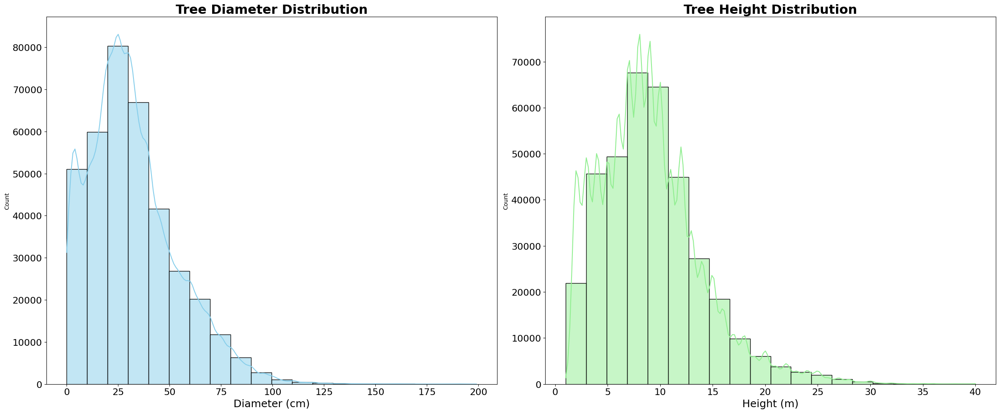

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

# Distribution of Trees by Diameter
sns.histplot(df['diametro_altura_pecho'], kde=True, bins=20, color='skyblue', ax=ax1)
ax1.set_title('Tree Diameter Distribution', fontsize=22, fontweight='bold') 
ax1.set_xlabel('Diameter (cm)', fontsize=18) 
ax1.tick_params(axis='x', labelsize=16) 
ax1.tick_params(axis='y', labelsize=16)  

# Distribution of Trees by Height
sns.histplot(df['altura_arbol'], kde=True, bins=20, color='lightgreen', ax=ax2)
ax2.set_title('Tree Height Distribution', fontsize=22, fontweight='bold') 
ax2.set_xlabel('Height (m)', fontsize=18)
ax2.tick_params(axis='x', labelsize=16) 
ax2.tick_params(axis='y', labelsize=16)  

plt.tight_layout()
plt.show()


## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

# 12. **Tableau Dashboard**
<a id="12"></a>


### [View on Tableau Public](https://public.tableau.com/views/BuenosAiresTreeCensusMap/Dashboard1?:language=es-ES&:sid=&:redirect=auth&:display_count=n&:origin=viz_share_link)

In [21]:
from IPython.display import HTML

tableau = """<div class='tableauPlaceholder' id='viz1732215310600' style='position: relative'><noscript><a href='https://www.kaggleusercontent.com'><img alt='Dashboard 1 ' src='https://public.tableau.com/static/images/Bu/BuenosAiresTreeCensusMap/Dashboard1/1_rss.png' style='border: none' /></a></noscript><object class='tableauViz' style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='BuenosAiresTreeCensusMap/Dashboard1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='device' value='desktop' /><param name='static_image' value='https://public.tableau.com/static/images/Bu/BuenosAiresTreeCensusMap/Dashboard1/1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='es-ES' /><param name='increment_view_count' value='no' /></object></div><script type='text/javascript'>var divElement = document.getElementById('viz1732215310600');var vizElement = divElement.getElementsByTagName('object')[0];if (divElement.offsetWidth > 800) {vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth * 0.55) + 'px';} else if (divElement.offsetWidth > 500) {vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth * 0.55) + 'px';} else {vizElement.style.width='100%';vizElement.style.height='1177px';}var scriptElement = document.createElement('script');scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';vizElement.parentNode.insertBefore(scriptElement, vizElement);</script>"""

HTML(tableau)

## <div style="text-align:center; border-radius:15px 50px; padding:30px; color:Black; margin:0; font-size:120%; background-color:#ccffcc; overflow:hidden"><b><strong><mark style="background-color:transparent;"></mark></strong></b>

**Thank you** for your time. If you found this notebook helpful, please consider **upvoting** and sharing your **feedback!**

[Kaggle](https://www.kaggle.com/martindambrosio) **|** [LinkedIn](https://www.linkedin.com/in/martin-german-dambrosio/)